# Data mining \& clustering

The goal if this practical is to adress the folowing problem: 
<center style="color:red" >  Given XXX raw, unlabeled documents, ... How to exploit/understand/represent them?</center>

In the previous week, we have seen how to represent textual data with the Bag of Words (BoW) model:
$$X = 
	\begin{matrix} 
	 & \textbf{t}_j \\
	 & \downarrow \\
	\textbf{d}_i \rightarrow &
	\begin{pmatrix} 
	x_{1,1} & \dots & x_{1,d} \\
	\vdots & \ddots & \vdots \\
	x_{N,1} & \dots & x_{N,d} \\
	\end{pmatrix}
	\end{matrix}
	$$

From this BoW representation, we want to answer the following questions:
1. Which clustering algorithm to choose?
    - K-means, LSA, pLSA, LDA
1. What results to expect?
    - Semantics, noise cleaning, etc...
1. Which qualitative and quantitative analyses to understand the groups?
[comment]: <> (%1. Comment boucler, itérer pour améliorer la qualité du processus?)


<span style="color:magenta" > In this practical, we use a **labeled dataset** in order to evaluate performances with quantitative and well-defined metrics. </span>


In [2]:
import numpy as np
import matplotlib.pyplot as plt

import codecs
import re
import os.path
import sklearn

## Data loading



In [3]:
from sklearn.datasets import fetch_20newsgroups
newsgroups_train = fetch_20newsgroups(subset='train')

In [4]:
# conversion BoW + tf-idf
from sklearn.feature_extraction.text import TfidfVectorizer
#vectorizer = TfidfVectorizer() 
vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=1000, stop_words='english')

vectors = vectorizer.fit_transform(newsgroups_train.data)
print(vectors.shape)

# sparsity measure = 44 active words over 1000 per document (157 over 130000) !!
print(vectors.nnz / float(vectors.shape[0]))

(11314, 1000)
44.164928407283014


In [5]:
# retrieve words
print([(i,vectorizer.get_feature_names_out()[i]) \
       for i in np.random.randint(vectors.shape[1], size=10)])

[(885, 'technical'), (954, 'virginia'), (998, 'york'), (17, '17'), (167, 'bnr'), (554, 'list'), (497, 'interested'), (9, '100'), (730, 'provide'), (918, 'turkish')]


In [6]:
# labels (only for evaluation)
Y = newsgroups_train.target
print(Y[:10]) 
print([newsgroups_train.target_names[i] for i in Y[:20]]) # vraie classe

[ 7  4  4  1 14 16 13  3  2  4]
['rec.autos', 'comp.sys.mac.hardware', 'comp.sys.mac.hardware', 'comp.graphics', 'sci.space', 'talk.politics.guns', 'sci.med', 'comp.sys.ibm.pc.hardware', 'comp.os.ms-windows.misc', 'comp.sys.mac.hardware', 'rec.motorcycles', 'talk.religion.misc', 'comp.sys.mac.hardware', 'sci.space', 'misc.forsale', 'alt.atheism', 'comp.graphics', 'rec.autos', 'sci.electronics', 'comp.windows.x']


# 0) Word clouds 
### Drawing word clouds from the raw corpus or words' frequencies :  [make word clouds !](https://github.com/amueller/word_cloud)

### Installation
If you are using pip:

`pip install wordcloud`

### If you are using conda, you can install from the conda-forge channel:

`conda install -c conda-forge wordcloud`

### Let's look at the most frequent words in this dataset

In [7]:
data = np.array(newsgroups_train.data)
corpus = "".join(data)
words = corpus.split() # optional args to choose the splitting chars
print("Nb mots=",len(words))
# Lets find the most frequence words Your code here

Nb mots= 3252437


### Plot the N frequent words and verify that its follows a Zipf law

In [8]:
def count_elements(seq) -> dict:
  hist = {}
  for i in seq:
    hist[i] = hist.get(i, 0) + 1
  return hist

counted = count_elements(words)
coun = sorted([v for k,v in counted.items()],reverse=True)

In [9]:
len(coun)

280308

### Experiment word clouds

(-0.5, 399.5, 199.5, -0.5)

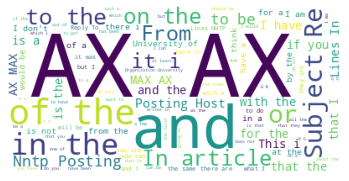

In [10]:
from wordcloud import WordCloud
wordcloud = WordCloud(background_color='white', stopwords = [], max_words=100).generate(corpus)            

plt.figure()
plt.imshow(wordcloud)
plt.axis('off')

(-0.5, 399.5, 199.5, -0.5)

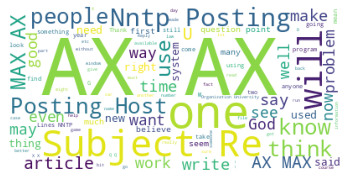

In [11]:
from wordcloud import STOPWORDS # Note: this is the default option           
wordcloud = WordCloud(background_color='white', stopwords = STOPWORDS, max_words=100).generate(corpus) 

plt.figure()
plt.imshow(wordcloud)
plt.axis("off")

### Use word clouds with generate\_from\_frequencies. 
N.B.: retrieve the most words frequencies using a CountVectorizer

In [12]:
# Your code here
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer()
bag_of_words = vectorizer.fit_transform(newsgroups_train.data)  # creer le bow
sum_words = bag_of_words.sum(axis=0) # nb occurrences de chaque mot
words_freq = [(str(word), sum_words[0, idx]) for word, idx in     vectorizer.vocabulary_.items()] # couple (mot, freq)
words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)  # trie par freq decroissante

k = 50 #
k_words_freq = words_freq[:k] # k mots les plus frequents
print(k_words_freq[:5])


[('the', 146532), ('to', 75064), ('of', 69034), ('ax', 62406), ('and', 57957)]


<BarContainer object of 50 artists>

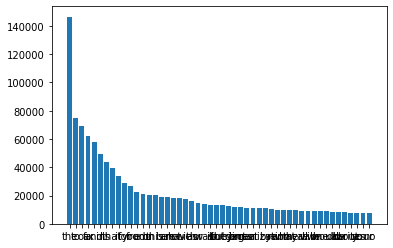

In [13]:
nmots = 50
x = [w for w,f in words_freq[:nmots]]
y = [f for w,f in words_freq[:nmots]]

plt.figure()
plt.bar(x,y)
# plt.axis('off')

On voit que la fréquence des mots suit la loi Zipf

(-0.5, 399.5, 199.5, -0.5)

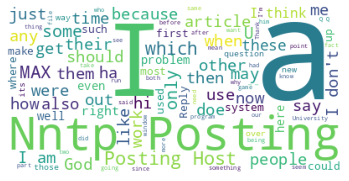

In [14]:
# Your code here
k = 50 # nb mots les plus feq
wordcloud = WordCloud(background_color='white', stopwords = [w for w,f in words_freq[:k]], max_words=100).generate(corpus)            

plt.figure()
plt.imshow(wordcloud)
plt.axis('off')

(-0.5, 399.5, 199.5, -0.5)

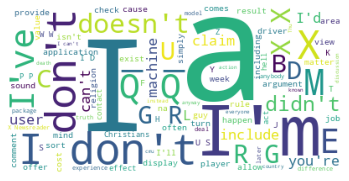

In [15]:
# Your code here
k = 500 # nb mots les plus feq
wordcloud = WordCloud(background_color='white', stopwords = [w for w,f in words_freq[:k]], max_words=100).generate(corpus)            

plt.figure()
plt.imshow(wordcloud)
plt.axis('off')

### Drawing word clouds from classes


In [16]:
# word clouds par classe
classes, nb_classe = np.unique(Y,return_counts=True)
print([cl_nb for cl_nb in zip(classes,nb_classe)])

[(0, 480), (1, 584), (2, 591), (3, 590), (4, 578), (5, 593), (6, 585), (7, 594), (8, 598), (9, 597), (10, 600), (11, 595), (12, 591), (13, 594), (14, 593), (15, 599), (16, 546), (17, 564), (18, 465), (19, 377)]


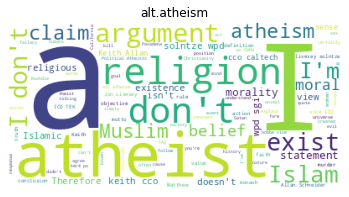

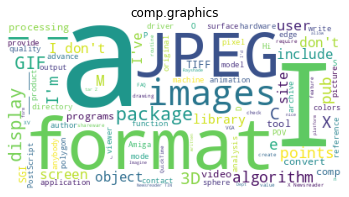

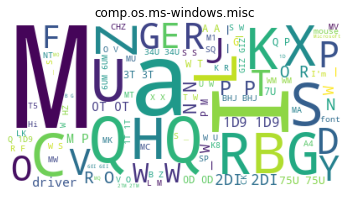

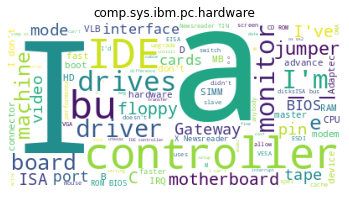

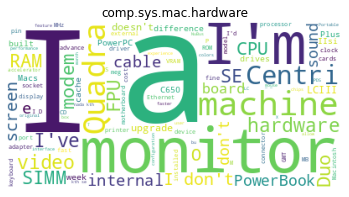

...

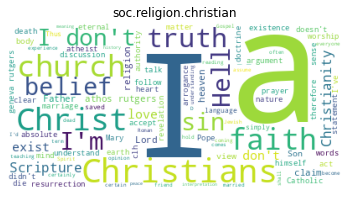

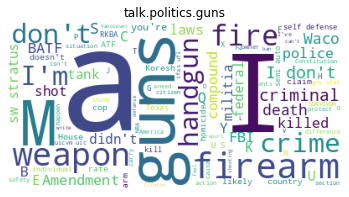

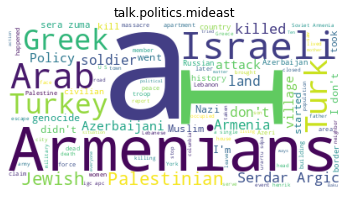

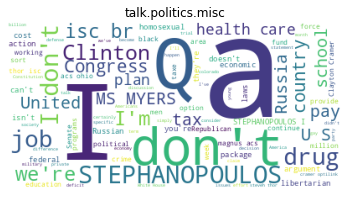

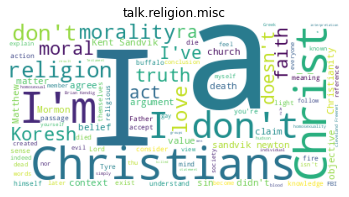

In [17]:
k = 500 # nb mots les plus feq
for cl in classes:
  i_cl = Y == cl
  data_cl = data[i_cl]
  corpus_cl = "".join(data_cl)
  
  wordcloud = WordCloud(background_color='white', stopwords = [w for w,f in words_freq[:k]], max_words=100).generate(corpus_cl)            

  plt.figure()
  plt.imshow(wordcloud)
  plt.title(newsgroups_train.target_names[cl])
  plt.axis('off')

# 1) Clustering algorithm: K-Means

**Let's start by the most famous and simple unsupervised algorithm: $k$-means!**
Look at [sklear documentation](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)
and apply it to your BoW matrix.


In [42]:
# on supprime les colonnes des mots frequents
nom_cols = [word for word, idx in vectorizer.vocabulary_.items() if word not in words_freq[:k]]
i_cols = [idx for word, idx in vectorizer.vocabulary_.items() if word not in words_freq[:k]]
bow = bag_of_words[:,i_cols]

In [19]:
print(len(nom_cols),len(i_cols),'\n',bag_of_words.shape,bow.shape)
print(data.shape)

130107 130107 
 (11314, 130107) (11314, 130107)
(11314,)


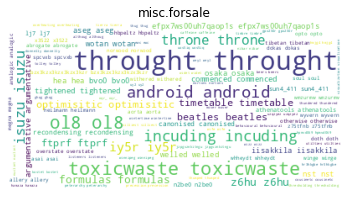

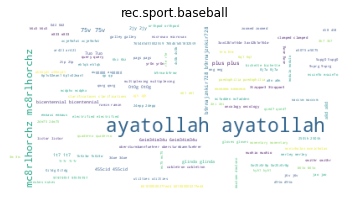

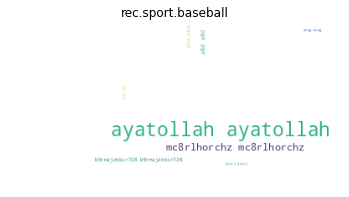

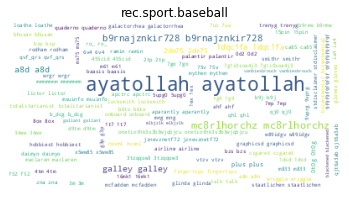

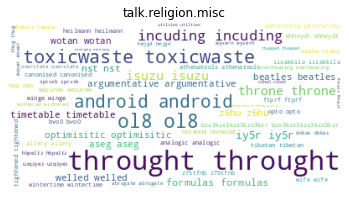

...

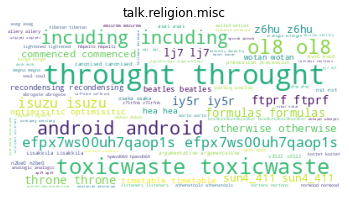

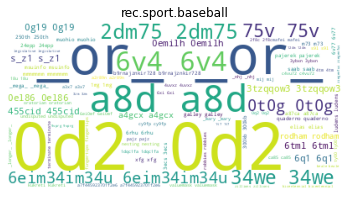

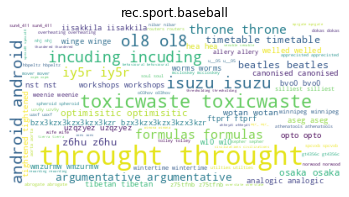

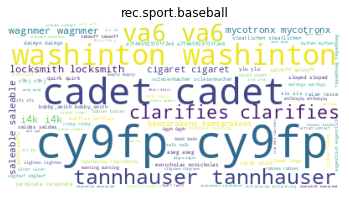

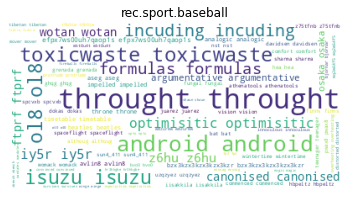

In [49]:
from sklearn.cluster import KMeans
# your code here
n_clusters = 20
kmeans = KMeans(n_clusters=n_clusters, random_state=0, max_iter=10).fit(bow)
# y_pred = kmeans.predict(bow)

# Getting clusters:
l_cl_major = []
lpjcj = []
clusters = []
for c in range(n_clusters):
  i_cl = kmeans.labels_ ==  c # elements du cluster c
  cls,nb_cls = np.unique(Y[i_cl],return_counts=True)  # vraie classe des elements de c
  
  cls,nb_cls = list(cls),list(nb_cls)
  for c1 in range(n_clusters):
    if c1 not in cls: # la classe n'est presente dans le clust
      cls.append(c1)
      nb_cls.append(0) # 0 pour les classes non presentes
  i_cls = np.argsort(cls)
  clusters.append([nb_cls[cls[i]] for i in i_cls])

  i_cls_trie = np.argsort(nb_cls) # tri par nbcl decroissant
  c_major = cls[i_cls_trie[0]] # cl maj
  l_cl_major.append(c_major)
  
  yet = max(nb_cls) # cardinal de la classe maj
  n = sum(nb_cls)
  pj = yet / n
  lpjcj.append((pj,n))
  
  sum_words = bow[i_cl].sum(axis=0).tolist()[0] # les nb de fois que chaque mot est present dans le clus c(seulement)
  # print('cluster:',c,sum_words[:3])
  # recopie chaque mot le nombre de fois qu'il est présent dans le cluster
  corpus_cl = []
  for i in range(len(nom_cols)):
    corpus_cl += [nom_cols[i]] * sum_words[i]
  corpus_cl = " ".join(corpus_cl)
  wordcloud = WordCloud(background_color='white', stopwords = [], max_words=100).generate(corpus_cl)

  plt.figure()
  plt.imshow(wordcloud)
  plt.title(newsgroups_train.target_names[i_cls_trie[0]]) # nom de la classe maj
  plt.axis('off')


In [50]:
# contenu des clusters
for c in clusters:
  print(list(c))

[157, 71, 100, 128, 125, 125, 44, 170, 157, 135, 179, 208, 147, 160, 149, 197, 215, 170, 183, 107]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 2, 2, 1, 1, 3, 11, 1, 4, 3, 8, 5, 13, 6, 1, 0, 0, 0, 0, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 1, 3, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[13, 1, 2, 4, 1, 3, 1, 3, 6, 23, 1, 11, 13, 30, 18, 44, 19, 25, 0, 0]
[2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[3, 4, 1, 1, 3, 3, 1, 4, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[52, 18, 12, 9, 10, 9, 2, 25, 15, 31, 38, 58, 16, 38, 46, 113, 73, 104, 55, 50]
[253, 490, 464, 4

In [51]:
# purete
p = sum([cj*pj for pj,cj in lpjcj])
print('purete: ',p)  

purete:  956.0


### Clustering Analysis: 
1. **Qualtitative:**
    - Look at the most important words for each cluster
    - Perform cluster assignement to each document, and compute word cloud on the document (raw text or frequencies)
2. **Quantitative:**
    - Compute cluster "purity": $p_j= \frac{|y^*|}{|C_j|}$, where $y^*$ is the most frequent (GT) label in cluster $C$ $\Rightarrow$ $p = \sum\limits_j |C_j| p_j$
    - Compute [Rand Score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.rand_score.html) and [Adjusted Rand Score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_rand_score.html#sklearn.metrics.adjusted_rand_score) 

# 2) Latent Semantic Analysis (LSA <=> SVD) 


**Remember the LSA factorziation**: 
$$ 
\begin{matrix} 
 & X  &\!\!\!\!\!=\!\!\!\!\!& U  & \Sigma & V^T \\
  & \textbf{t}_j   &  & \hat{ \textbf{d}_i} & &  \\
 & \downarrow  &  &\downarrow  & & \\
\textbf{d}_i \rightarrow 
&
\begin{pmatrix} 
x_{1,1} & \dots & x_{1,d} \\
\\
\vdots & \ddots & \vdots \\
\\
x_{N,1} & \dots & x_{N,d} \\
\end{pmatrix}
&
\!\!\!\!\!=\!\!\!\!\!
%&
%(\hat{ \textbf{t}_j}) \rightarrow
&
\begin{pmatrix} 
\begin{pmatrix} &  \textbf{u}_1 &  \end{pmatrix} \\
\vdots \\
\begin{pmatrix}  & \textbf{u}_k &  \end{pmatrix}
\end{pmatrix}
%&
%\!\!\!\!\!\cdot\!\!\!\!\!
&
\begin{pmatrix} 
\sigma_1 & \dots & 0 \\
\vdots & \ddots & \vdots \\
0 & \dots & \sigma_k \\
\end{pmatrix}
%&
%\!\!\!\!\!\cdot\!\!\!\!\!
&
\begin{pmatrix} 
\begin{pmatrix} \, \\ \, \\ \textbf{v}_1 \\ \, \\ \,\end{pmatrix} 
\dots
\begin{pmatrix} \, \\ \, \\ \textbf{v}_k \\ \, \\ \, \end{pmatrix}
\end{pmatrix}
\end{matrix}
$$

- Look at [SVD doc in skelarn](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.TruncatedSVD.html#sklearn.decomposition.TruncatedSVD)
- Do the same qualitative/quantitative evaluation than with K-Means
- You can also use LSA as a pre-processing step for K-Means, *i.e.* running K-Means on $\boldsymbol{U}$ matrix above
    - N.B. : try without/with $\ell_2$ normalization of $\boldsymbol{U}$'s rows before running  K-Means
    - You can also benefit from LSA pre-processing for using [t-SNE visualization](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html) (see code below)


In [31]:
bow.shape

(11314, 130107)

/usr/local/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


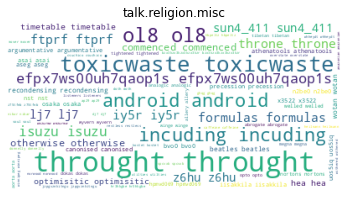

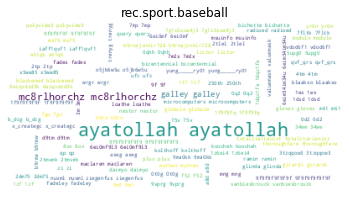

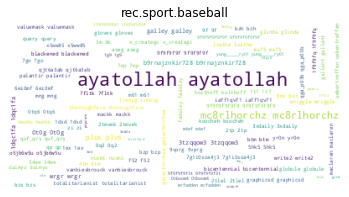

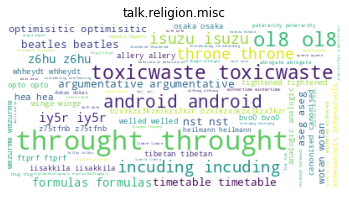

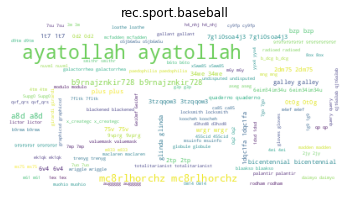

...

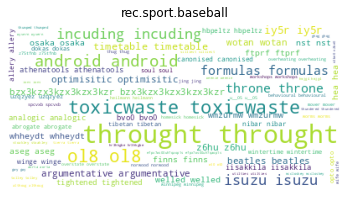

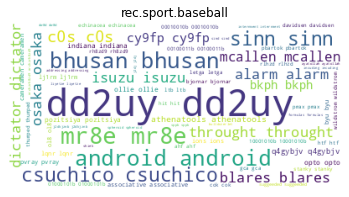

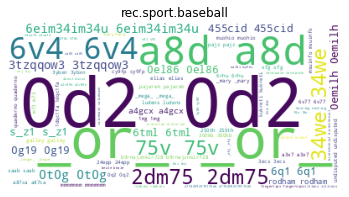

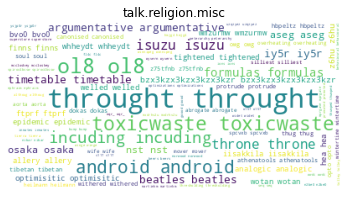

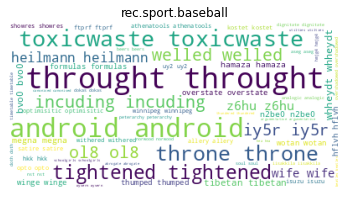

In [52]:
from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components=100, n_iter=10, random_state=0)
U = svd.fit_transform(bow)

# sans normalisation avec la matrice U
n_clusters = 20
kmeans = KMeans(n_clusters=n_clusters, random_state=0, max_iter=10).fit(U)
# y_pred = kmeans.predict(U)

# Getting clusters:
l_cl_major = []
lpjcj = []
clusters = []
for c in range(n_clusters):
  i_cl = kmeans.labels_ ==  c # elements du cluster c
  cls,nb_cls = np.unique(Y[i_cl],return_counts=True)  # vraie classe des elements de c
  
  cls,nb_cls = list(cls),list(nb_cls)
  for c1 in range(n_clusters):
    if c1 not in cls: # la classe n'est presente dans le clust
      cls.append(c1)
      nb_cls.append(0) # 0 pour les classes non presentes
  i_cls = np.argsort(cls)
  clusters.append([nb_cls[cls[i]] for i in i_cls])

  i_cls_trie = np.argsort(nb_cls) # tri par nbcl decroissant
  c_major = cls[i_cls_trie[0]] # cl maj
  l_cl_major.append(c_major)
  
  yet = max(nb_cls) # cardinal de la classe maj
  n = sum(nb_cls)
  pj = yet / n
  lpjcj.append((pj,n))
  
  sum_words = bow[i_cl].sum(axis=0).tolist()[0] # les nb de fois que chaque mot est present dans le clus c(seulement)
  # print('cluster:',c,sum_words[:3])
  # recopie chaque mot le nombre de fois qu'il est présent dans le cluster
  corpus_cl = []
  for i in range(len(nom_cols)):
    corpus_cl += [nom_cols[i]] * sum_words[i]
  corpus_cl = " ".join(corpus_cl)
  wordcloud = WordCloud(background_color='white', stopwords = [], max_words=100).generate(corpus_cl)

  plt.figure()
  plt.imshow(wordcloud)
  plt.title(newsgroups_train.target_names[i_cls_trie[0]]) # nom de la classe maj
  plt.axis('off')


In [46]:
# contenu des clusters
for c in clusters:
  print(list(c))

[157, 71, 100, 128, 125, 125, 44, 170, 157, 135, 179, 208, 147, 160, 149, 197, 215, 170, 183, 107]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 2, 2, 1, 1, 3, 11, 1, 4, 3, 8, 5, 13, 6, 1, 0, 0, 0, 0, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 1, 3, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[13, 1, 2, 4, 1, 3, 1, 3, 6, 23, 1, 11, 13, 30, 18, 44, 19, 25, 0, 0]
[2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[3, 4, 1, 1, 3, 3, 1, 4, 3, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[52, 18, 12, 9, 10, 9, 2, 25, 15, 31, 38, 58, 16, 38, 46, 113, 73, 104, 55, 50]
[253, 490, 464, 4

In [53]:
# purete
p = sum([cj*pj for pj,cj in lpjcj])
print('purete: ',p)  

purete:  949.0


/usr/local/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


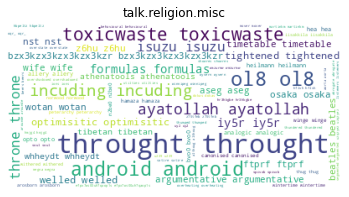

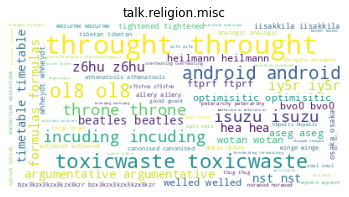

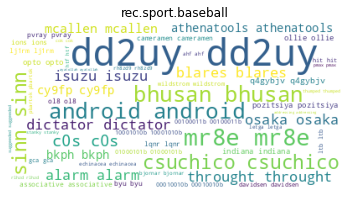

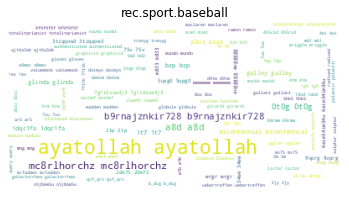

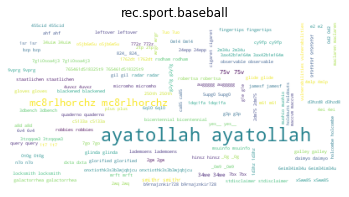

...

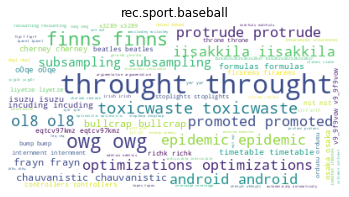

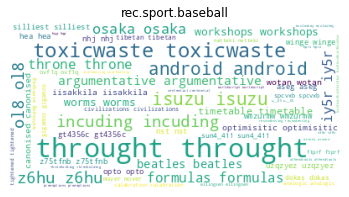

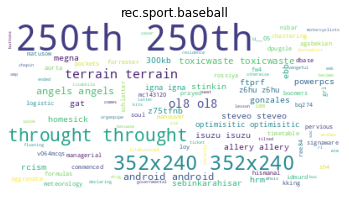

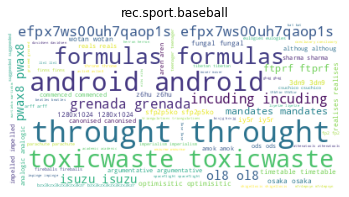

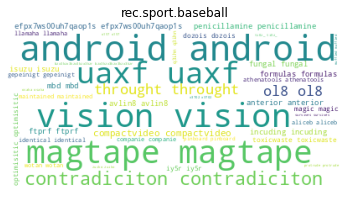

In [54]:
from sklearn.decomposition import TruncatedSVD
svd = TruncatedSVD(n_components=100, n_iter=10, random_state=0)
U = svd.fit_transform(bow)

# avec la normalisation l2 avec la matrice U
l2_normes = np.linalg.norm(U, axis=0)
U_n = U / l2_normes

n_clusters = 20
kmeans = KMeans(n_clusters=n_clusters, random_state=0, max_iter=10).fit(U_n)
# y_pred = kmeans.predict(U)

# Getting clusters:
l_cl_major = []
lpjcj = []
clusters = []
for c in range(n_clusters):
  i_cl = kmeans.labels_ ==  c # elements du cluster c
  cls,nb_cls = np.unique(Y[i_cl],return_counts=True)  # vraie classe des elements de c
  
  cls,nb_cls = list(cls),list(nb_cls)
  for c1 in range(n_clusters):
    if c1 not in cls: # la classe n'est presente dans le clust
      cls.append(c1)
      nb_cls.append(0) # 0 pour les classes non presentes
  i_cls = np.argsort(cls)
  clusters.append([nb_cls[cls[i]] for i in i_cls])

  i_cls_trie = np.argsort(nb_cls) # tri par nbcl decroissant
  c_major = cls[i_cls_trie[0]] # cl maj
  l_cl_major.append(c_major)
  
  yet = max(nb_cls) # cardinal de la classe maj
  n = sum(nb_cls)
  pj = yet / n
  lpjcj.append((pj,n))
  
  sum_words = bow[i_cl].sum(axis=0).tolist()[0] # les nb de fois que chaque mot est present dans le clus c(seulement)
  # print('cluster:',c,sum_words[:3])
  # recopie chaque mot le nombre de fois qu'il est présent dans le cluster
  corpus_cl = []
  for i in range(len(nom_cols)):
    corpus_cl += [nom_cols[i]] * sum_words[i]
  corpus_cl = " ".join(corpus_cl)
  wordcloud = WordCloud(background_color='white', stopwords = [], max_words=100).generate(corpus_cl)

  plt.figure()
  plt.imshow(wordcloud)
  plt.title(newsgroups_train.target_names[i_cls_trie[0]]) # nom de la classe maj
  plt.axis('off')


In [55]:
# contenu des clusters
for c in clusters:
  print(list(c))

[2, 1, 2, 14, 3, 2, 1, 4, 1, 5, 2, 1, 1, 39, 2, 0, 0, 0, 0, 0]
[42, 1, 4, 2, 2, 1, 1, 2, 31, 34, 22, 1, 13, 11, 91, 44, 48, 28, 43, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[4, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[283, 436, 423, 380, 458, 360, 453, 326, 278, 439, 419, 216, 379, 327, 373, 361, 257, 329, 219, 168]
[152, 145, 153, 194, 120, 224, 131, 265, 317, 123, 144, 350, 210, 252, 208, 147, 242, 148, 218, 164]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

In [56]:
# purete
p = sum([cj*pj for pj,cj in lpjcj])
print('purete: ',p)  

purete:  959.0


In [57]:
# t-SNE from the U matrix computed by LSA
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2, init='pca',n_iter=5000, verbose=2)
tsne_mat = tsne.fit_transform(U)

In [ ]:
NN2cluster = np.argmax(np.abs(vectors_SVDn), axis=0)
#import seaborn as sns
import matplotlib.cm as cm
cmap = cm.tab20
cmap = cm.get_cmap('hsv', 20) 
cmap = cm.get_cmap('jet', 20)
#cmap = cm.tab20

plt.figure(figsize=(15,10))
plt.scatter(tsne_mat[:,0],tsne_mat[:,1], c=Y, cmap=cmap, s=10)
plt.scatter(tsne_mat[NN2cluster[:],0],tsne_mat[NN2cluster[:],1], c='black', s=100)
#plt.scatter(tsne_mat[NN2cluster2[:],0],tsne_mat[NN2cluster2[:],1], c='red', s=100)
plt.colorbar(ticks=range(20))

# 3) Latent Dirichlet Allocation (LDA)

Perform the same experiments with LDA:
- LDA
https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.LatentDirichletAllocation.html


**Start with a CountVectorizer**

In [75]:
from nltk.tokenize import RegexpTokenizer
from sklearn.feature_extraction.text import CountVectorizer

# Initialize regex tokenizer
tokenizer = RegexpTokenizer(r'\w+')

# Vectorize document using TF-IDF
vectorizer = CountVectorizer(lowercase=True,
                        stop_words='english',
                        ngram_range = (1,1),
                        tokenizer = tokenizer.tokenize, max_df=0.95, min_df=2, max_features=1000)

vectors = vectorizer.fit_transform(newsgroups_train.data)
print(vectors.shape)
print(vectors.nnz / float(vectors.shape[0]))



(11314, 1000)
48.02527841612162


/usr/local/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


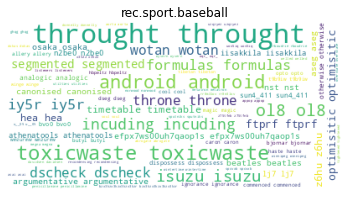

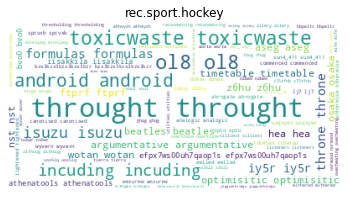

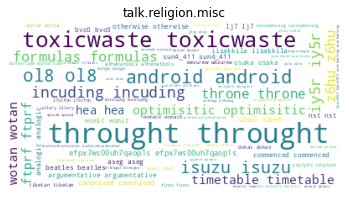

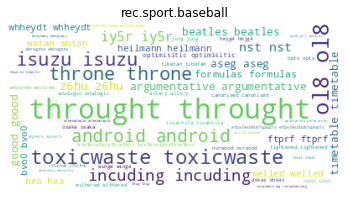

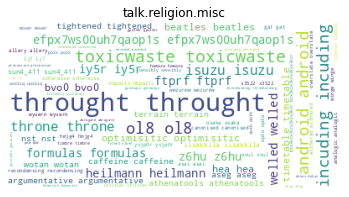

...

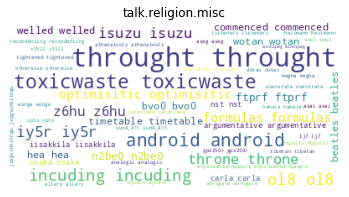

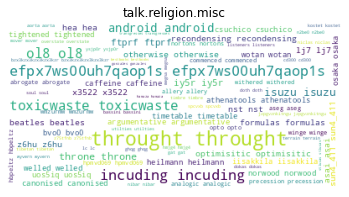

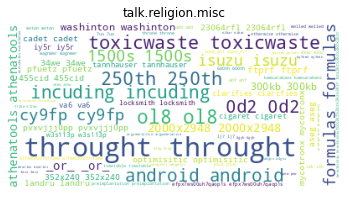

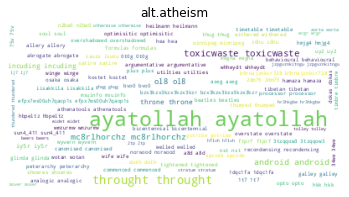

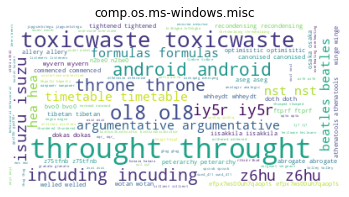

In [59]:
from sklearn.decomposition import LatentDirichletAllocation

# Modélisation de sujet avec LDA
lda_model = LatentDirichletAllocation(n_components=n_clusters, max_iter=10)
lda = lda_model.fit_transform(vectors)

# Clustering des documents avec KMeans
n_clusters = 20
kmeans_model = KMeans(n_clusters=n_clusters, random_state=0, max_iter=10)
kmeans = kmeans_model.fit(lda)

# Getting clusters:
l_cl_major = []
lpjcj = []
clusters = []
for c in range(n_clusters):
  i_cl = kmeans.labels_ ==  c # elements du cluster c
  cls,nb_cls = np.unique(Y[i_cl],return_counts=True)  # vraie classe des elements de c
  
  cls,nb_cls = list(cls),list(nb_cls)
  for c1 in range(n_clusters):
    if c1 not in cls: # la classe n'est presente dans le clust
      cls.append(c1)
      nb_cls.append(0) # 0 pour les classes non presentes
  i_cls = np.argsort(cls)
  clusters.append([nb_cls[cls[i]] for i in i_cls])

  i_cls_trie = np.argsort(nb_cls) # tri par nbcl decroissant
  c_major = cls[i_cls_trie[0]] # cl maj
  l_cl_major.append(c_major)
  
  yet = max(nb_cls) # cardinal de la classe maj
  n = sum(nb_cls)
  pj = yet / n
  lpjcj.append((pj,n))
  
  sum_words = bow[i_cl].sum(axis=0).tolist()[0] # les nb de fois que chaque mot est present dans le clus c(seulement)
  # print('cluster:',c,sum_words[:3])
  # recopie chaque mot le nombre de fois qu'il est présent dans le cluster
  corpus_cl = []
  for i in range(len(nom_cols)):
    corpus_cl += [nom_cols[i]] * sum_words[i]
  corpus_cl = " ".join(corpus_cl)
  wordcloud = WordCloud(background_color='white', stopwords = [], max_words=100).generate(corpus_cl)

  plt.figure()
  plt.imshow(wordcloud)
  plt.title(newsgroups_train.target_names[i_cls_trie[0]]) # nom de la classe maj
  plt.axis('off')


In [60]:
# contenu des clusters
for c in clusters:
  print(list(c))

[4, 14, 192, 134, 41, 1, 1, 2, 16, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[2, 13, 5, 11, 9, 1, 25, 14, 12, 4, 1, 7, 162, 100, 99, 5, 21, 9, 26, 6]
[159, 338, 118, 91, 322, 20, 1, 1, 10, 28, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[89, 11, 291, 1, 3, 2, 94, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[4, 16, 4, 3, 5, 2, 4, 10, 10, 210, 339, 1, 12, 8, 19, 1, 3, 4, 7, 1]
[13, 42, 39, 61, 95, 33, 153, 47, 36, 40, 29, 2, 48, 25, 20, 4, 16, 33, 13, 28]
[11, 32, 35, 49, 30, 37, 38, 49, 65, 42, 10, 49, 57, 45, 67, 9, 51, 17, 43, 17]
[8, 22, 21, 12, 36, 9, 19, 131, 156, 40, 9, 19, 59, 52, 33, 9, 23, 9, 19, 8]
[18, 144, 49, 59, 66, 79, 16, 20, 23, 8, 9, 23, 77, 34, 26, 11, 7, 10, 9, 10]
[1, 1, 1, 2, 2, 12, 299, 13, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[1, 6, 3, 1, 311, 4, 2, 1, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[70, 30, 25, 30, 34, 18, 24, 46, 45, 51, 29, 27, 41, 130, 64, 32, 51, 60, 61, 21]
[155, 4, 1, 4, 1, 6, 3, 46, 8, 182, 6, 4, 19, 104, 0, 0, 0, 0, 0, 0]
[3, 73, 12, 10, 7, 68, 15, 8, 6, 3, 3, 33, 9, 20, 140, 3

In [61]:
# purete
p = sum([cj*pj for pj,cj in lpjcj])
print('purete: ',p)  

purete:  3769.0


Le LDA est meilleur que les deux autres.

## LDA-viz

In [77]:
# pip install install pyldavis
from __future__ import print_function

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()


vis_data = pyLDAvis.sklearn.prepare(lda,vectors,vectorizer)

# Afficher le résultat
pyLDAvis.display(vis_data)

# Performances evaluation

**Compare the different approaches wrt three quantitative metrics.**

Le LDA est meilleur que les autres.